In [22]:
# CHIMES IMPORTATION
import sys
sys.path.insert(0, '../../')
import chimes as chm


from IPython.display import display,HTML,Markdown
from IPython.display import IFrame
from itables import init_notebook_mode,options
options.columnDefs = [{"className": "dt-left", "targets": "_all"}]
options.classes="display nowrap compact"
options.scrollY="400px"
options.scrollCollapse=True
options.paging=False

init_notebook_mode(all_interactive=True)
%matplotlib widget

# Pandas display
import pandas as pd
import numpy as np
pd.set_option('display.max_colwidth', None)
pd.set_option("display.colheader_justify","left")

## Tomas Mazak's workaround
import plotly
import plotly.graph_objs as go
from IPython.display import display, HTML
plotly.offline.init_notebook_mode()
display(HTML('<script type="text/javascript" async src="https://cdnjs.cloudflare.com/ajax/libs/mathjax/2.7.1/MathJax.js?config=TeX-MML-AM_SVG"></script>'))

<IPython.core.display.Javascript object>

# TL:DR (Too long, didn't read)

Here is the resume of everything seen in this tutorial
```
# TO KNOW WHAT YOU CAN LOAD
chm.get_available_models() # to know model names 
chn.get_available_saves() # to know saves names

# TO LOAD A MODEL
hub=chm.Hub('modelname',)
hub=chm.load_saved('savename or full adress')

hub.get_summary()           # Basic general informations
values = hub.get_dvalues()  # Values 

hub.run()                   # do the simulation
hub.plot()                  # return the results

hub.set_fields()            # change fields values
hub.set_preset(presetname)  # load a preset of values
hub.plot_preset()           # plot the preset content
```

# CHIMES Hub Basics

Models are made to interact with. All the interactions can be done through a CHIMES object called 'Hub`. Here, we show how to use it with one model, a Lorenz System (the famous chaos butterfly). 

## What is a Hub ?

The normal approach is to construct a Hub around a model. It is a CHIMES object that will decypher the model file and give you methods to interact with it. 

When you initialize a Huh with a model, it will: 
* Find what are all the fields that exist in the model
* Determine if they are differential, state variable, parameters
* Try to find as many existing information as possible (typically in CHIMES library) that has not been put by the model creator but exist in a common database. It can be :
    * units 
    * symbol
    * definition 
    * default value
    * ...
* Find an order to calculate the system at each timestep, and what variables are necessary (in loops)
* Preparing allocation for future time calculation and make calculation faster
* Making the model elements ready to be displayed in a user-friendly manner
* A bit of coffee for you 

In this example we call the created object `hub` (although the name could be anything you like !)


Two ways to create a Hub: 
* Creating it from a model file `hub=chm.Hub('modelname')` you can find models in `chm.get_available_models()` to get modelnames
* Loading a saved hub `hub=chm.Load('savename')` you can find saved files in `chm.get_available_saves()` to get savenames

### Knowing what is accessible to go in the hub

In [23]:
modelist = chm.get_available_models(Return=True)
chm.get_available_models() # We check model names to be sure how we write it

Folder                     \
CHI                                           Core   
Climate_3Layers                               Core   
GK                                            Core   
E-CHIMES                                   ECHIMES   
E-CHIMES0                  ECHIMES\NotIncorporated   
_CESprod                   ECHIMES\NotIncorporated   
Attractor1D                               EXAMPLES   
Goodwin_example                           EXAMPLES   
Goodwin_example_short                     EXAMPLES   
Lorenz_Attractor                          EXAMPLES   
PDE-Diffusion                             EXAMPLES   
TUTORIAL                                  EXAMPLES   
_EXTERNALCOUPLING                        Extension   
GEMMES_Coping2018                           Gemmes   
3Capital                                      ICED   
ICED                                          ICED   
Aizawa_Attractor                     Miscellaneous   
Halvorsen_Attractor                  Miscellaneous   
Rossler_Attractor                    Miscellaneous   
stochastic                           Miscellaneous   
_EXTERNALCOUPLING_Matter             Miscellaneous   
Agents_Vicsek                 Miscellaneous\Agents   
DoublePendulum            Miscellaneous\Attractors   
PDE-Waves                                  Spatial   

                         Short Documentation                                                            \
CHI                                                             Human-Capital Instability: Causal core   
Climate_3Layers                       This is a 3-Layer CLimate model, that gives temperature anomaly.   
GK                                               Goodwin-Keen model: savings-investment dynamics with    
E-CHIMES                                                        Economic Core for multisectoral models   
E-CHIMES0                                                       Economic Core for multisectoral models   
_CESprod                                                        Transform production function to a CES   
Attractor1D                                Stochastic movement in a two-relative equilibrium potential   
Goodwin_example                                  A Goodwin model of an economy. Independant model file   
Goodwin_example_short                                             Goodwin model with minimal formalism   
Lorenz_Attractor                                           Lorenz Chaotic Attractor: Butterfly effect!   
PDE-Diffusion                          Spatial Diffusion Dynamics using Partial differential equations   
TUTORIAL                  Highly commented Template to write your model. This is the short description   
_EXTERNALCOUPLING                                 Homemade API for external coupling, on a dummy model   
GEMMES_Coping2018                                                          GEMMES 2018 : GK + Climate    
3Capital                     Energy (Green-Brown) + Output (Grey) Capital model with market allocation   
ICED                                                                 Inequality-Carbon-Energy-Dynamics   
Aizawa_Attractor                                                              Aizawa Chaotic Attractor   
Halvorsen_Attractor                                                        Halvorsen Chaotic Attractor   
Rossler_Attractor                                                            Rossler Chaotic Attractor   
stochastic                                                                        Stochastic dynamics    
_EXTERNALCOUPLING_Matter                   Template to write your model. This is the short description   
Agents_Vicsek                                                                 Movement synchronization   
DoublePendulum                                                Double Uniform Pendulum Chaotic Dynamics   
PDE-Waves                                         Wave propagation with convection and diffusion in 1D   

                       

In [24]:
name = 'Lorenz_Attractor'
chm.get_model_documentation(name) # We look deeper to its properties

Output()

### Loading a model in a Hub

To load a model into the hub, simply declare the hub and the name of the model together `hub=chm.Hub(modelname)`

In [5]:
hub=chm.Hub(name)   # For short !

### Getting basic informations 

In most situations, the method `get_summary()` should cover your needs. 
It covers the flags of the system, theiur preset names, and fields by category with their attributes. As we will see after, get_summary displays the last value of the simulation when a run has been done.

In [6]:
hub.get_summary()           # Basic general informations

############################################################
####################      SUMMARY       ####################
############################################################
Model       : Lorenz_Attractor
Lorenz Chaotic Attractor: Butterfly effect!
File        : c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\..\models\EXAMPLES\_model_Lorenz_Attractor.py
#################### Fields ####################
statevar        002 ['distance1', 'distance2']
differential    004 ['x', 'y', 'z', 'time']
parameters      004 ['lor_sigma', 'lor_rho', 'lor_beta', 'Nprod']
#################### Presets ####################
     Canonical example  : Chaotic attractor around two equilibrium, for those parameter values
          BeginEQ1      : Begins at the first equilibrium
#################### Flags ####################
run            : [0, 0]
cycles         : False
sensitivity    : False
derivative     : False
convergence    : False
multisectoral  : False
multiregional  : False
Parral

### Simulating 100 years

By default, simulations are done one 100 years, with a timestep of 0.1 year. When asking for a run, the system will compute each timestep using an RK4 scheme. The values will be updated in the `get_summary`

In [7]:
hub.run()                   # do the simulation

time step 1000 / 1000


### Representing all variables evolution

The easiest way to represent a run of the model is to display the variables. the function `hub.plot()` is doing that directly, with a classification of each variable by their unit 

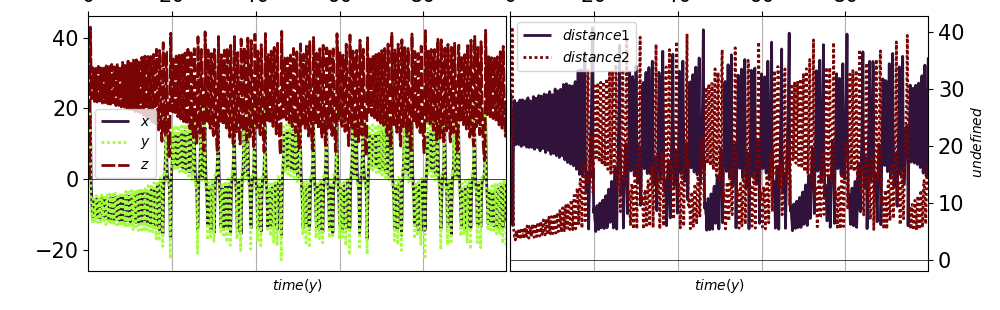

In [8]:
hub.plot()                  # return the results

### Retrieving values as a dictionnary

If you want to analyze the data by yourself, or plug then somewhere else, you can use `hub.get_dvalue` to get a dictionnary of the time evolution. A more extensive acces can be done with `get_dfields` as explained later

In [9]:
values = hub.get_dvalues(params=True)  # Values 
print('type',type(values))
for k,v in values.items():
    print(k,np.shape(v))

type <class 'dict'>
distance1 (1000,)
distance2 (1000,)
x (1000,)
y (1000,)
z (1000,)
time (1000,)
lor_sigma (1,)
lor_rho (1,)
lor_beta (1,)


### Changing a field value

The method `set_fields` is central in your interactions with the Hub. 
You can change fields that are differential variables (in this case, the initial condition), parameters, and numerical parameters. 
Of course you cannot impose state variables, but you can change the values of the variables it depends of

You can change either values one by one with `hub.set_fields(fieldname=value)`, or multiple at once `hub.set_fields(**{field1:value1, field2:value2, [...]})` 

it is always recommended to verify that it works using `hub.get_summar()` afterward

When a new value is set, the system automatically reset, if you want to save your previous run either do a `hub2=hub.copy()` or `hub.save(filename)` to keep a track of it.
You can change values in the middle of a run, but that's for advanced uses !

In [10]:
hub.set_fields(Tsim=30) # The simulation now runs for 30 years
hub.set_fields(dt=0.04) # Timestep are now 0.05 years 
hub.set_fields(x=0,y=1,z=0)

changes = dict(x=0,y=1,z=0)
hub.set_fields(**changes)  # if you want to do it in two steps

hub.get_summary()

############################################################
####################      SUMMARY       ####################
############################################################
Model       : Lorenz_Attractor
Lorenz Chaotic Attractor: Butterfly effect!
File        : c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\..\models\EXAMPLES\_model_Lorenz_Attractor.py
#################### Fields ####################
statevar        002 ['distance1', 'distance2']
differential    004 ['x', 'y', 'z', 'time']
parameters      004 ['lor_sigma', 'lor_rho', 'lor_beta', 'Nprod']
#################### Presets ####################
     Canonical example  : Chaotic attractor around two equilibrium, for those parameter values
          BeginEQ1      : Begins at the first equilibrium
#################### Flags ####################
run            : [0, 0]
cycles         : False
sensitivity    : False
derivative     : False
convergence    : False
multisectoral  : False
multiregional  : False
Parral

### Loading a preset

A preset is an ensemble of field values and plots that has been created to show a typical behavior of the system, or a calibrated run. 
You can find available preset using `hub.get_preset()` and then load it using `hub.set_preset`. 
Once the system has run, you can plot the preselected plots using `hub.plot_preset`

time step 3000 / 3000


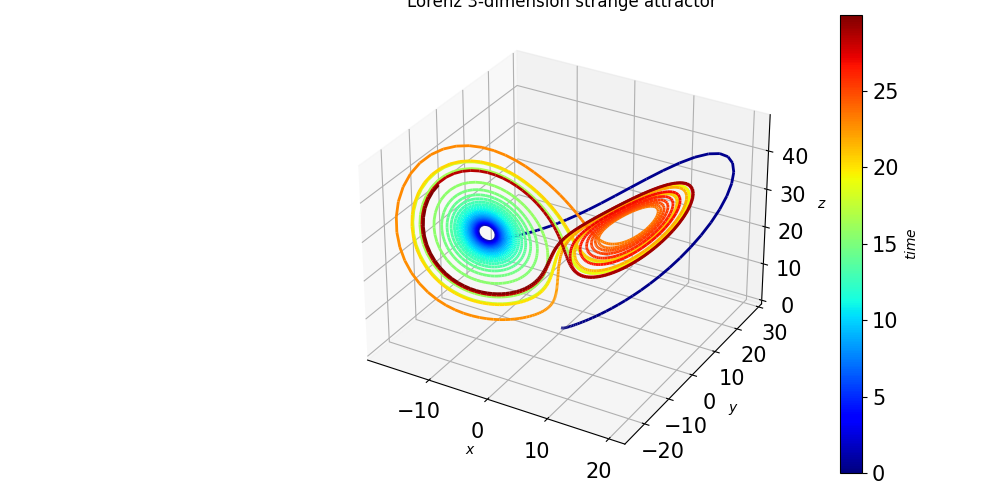


Model       : Lorenz_Attractor
Lorenz Chaotic Attractor: Butterfly effect!
File        : c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\..\models\EXAMPLES\_model_Lorenz_Attractor.py
#################### Fields ####################
statevar        002 ['distance1', 'distance2']
differential    004 ['x', 'y', 'z', 'time']
parameters      004 ['lor_sigma', 'lor_rho', 'lor_beta', 'Nprod']
#################### Presets ####################
     Canonical example  : Chaotic attractor around two equilibrium, for those parameter values
          BeginEQ1      : Begins at the first equilibrium
#################### Flags ####################
run            : [2999, 29.99000000000189]
cycles         : False
sensitivity    : False
derivative     : False
convergence    : False
multisectoral  : False
multiregional  : False
Parrallel      : False
reinterpolated : False
preset         : Canonical example
#################### Time vector ####################
Tsim                30            

In [12]:
hub.set_preset('Canonical example')
hub.run()
hub.plot_preset()

### Supplements

Some models have supplements, functions and method tailored for the model to manipulate it: finding analytically the equilibrium, doing a serie of plots... 
To acces the use `hub.get_available_supplements()`, they can be then used with `hub.supplements[supplementname](arguments_of_the_function)`

In [13]:
hub=chm.Hub('Lorenz_Attractor')
hub.get_supplements()

,documentation,signature
OneTenthPercentUncertainty,Run the canonical example with 1% uncertainty on initial conditions and display it in an nyaxis plot,(hub)


In [14]:
hub.supplements['OneTenthPercentUncertainty'](hub)
# In this example, the system run 10 times in parrallel with 1% of uncertainty on the initial conditions and parameters values

time step 10000 / 10000
Model       : Lorenz_Attractor
Lorenz Chaotic Attractor: Butterfly effect!
File        : c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\..\models\EXAMPLES\_model_Lorenz_Attractor.py
#################### Fields ####################
statevar        002 ['distance1', 'distance2']
differential    004 ['x', 'y', 'z', 'time']
parameters      004 ['lor_sigma', 'lor_rho', 'lor_beta', 'Nprod']
#################### Presets ####################
     Canonical example  : Chaotic attractor around two equilibrium, for those parameter values
          BeginEQ1      : Begins at the first equilibrium
#################### Flags ####################
run            : [9999, 99.99000000001425]
cycles         : False
sensitivity    : True
derivative     : False
convergence    : False
multisectoral  : False
multiregional  : False
Parrallel      : True
reinterpolated : False
preset         : Canonical example
#################### Time vector ####################
Tsim         

### Changing values :a first exposition to set_fields
`set_fields` is a very powerful tool to modify your system. 
Here is simply some basic uses.
* To change the simulated time, use `hub.set_fields(Tsim=YOUR_VALUE)`, it works with:   
    * 'Tsim' duration of the simulated time
    * 'dt'   duration of one timestep
    * 'nx'   number of systems in parallel
    * 'nr'   number of regions
* To change a parameter or an initial condition F, use `hub.set_fields(F=YOUR_VALUE)`
* To change multiple at a time, you can add each entry separately
* If you have multiple dimensions (parrallel, regions, multiple agents)... The system will be default broadcast, or adapt the value. 

In [15]:
hub=chm.Hub('GK') 
hub.set_fields(Tsim=30) # The simulation now runs for 30 years
hub.set_fields(
    alpha=0,
    n=0.1
)
hub.get_summary()

############################################################
####################      SUMMARY       ####################
############################################################
Model       : GK
Goodwin-Keen model: savings-investment dynamics with 
File        : c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\tests\..\models\Core\_model_GK.py
#################### Fields ####################
statevar        016 ['Y', 'L', 'GDP', 'd', 'omega', 'employment', 'c', 'Pi', 'inflation', 'phillips', 'pi', 'kappa', 'I', 'Ir', 'g', 'C']
differential    008 ['a', 'N', 'K', 'w', 'p', 'D', 'Dh', 'time']
parameters      015 ['alpha', 'n', 'delta', 'r', 'nu', 'eta', 'mu', 'k0', 'k1', 'k2', 'phinull', 'phi0', 'phi1', 'Delta', 'Nprod']
#################### Presets ####################
          default       : Convergence to equilibrium
         debtcrisis     : Path toward infinite relative debt
     debtstabilisation  : Stabilization through excess of debt
#################### Flags ##########

Much more elaborated value settings can be done

In [16]:
hub=chm.Hub('GK')
hub.set_fields(nx=6,nr=['France','China','USA'])         # We create many regions and parrallel system
hub.set_fields('nu',[['nr',0],['nx',0,4],[0.5,0.2]])     # We only modify one of those, with a list approach
print(hub.get_dfields()['nu']['value'][:,:,0,0])         # Here are the final values


hub.set_fields('alpha',{'nr':['France','USA'], 'nx':1, 'value':0.5}) #will do the same !
print(hub.get_dfields()['alpha']['value'][:,:,0,0])         # Here are the final values


{'nr': [0], 'nx': [0, 4], 'value': [0.5, 0.2]}
{'nr': [0], 'nx': [0, 4], 'value': [0.5, 0.2]}
{'nr': [0], 'nx': [0, 4], 'value': array([0.5, 0.2])}
[[0.5 3.  3. ]
 [3.  3.  3. ]
 [3.  3.  3. ]
 [3.  3.  3. ]
 [0.2 3.  3. ]
 [3.  3.  3. ]]
{'nr': ['France', 'USA'], 'nx': [1], 'value': [0.5]}
{'nr': [0, 2], 'nx': [1], 'value': [0.5]}
{'nr': [0, 2], 'nx': [1], 'value': array([0.5])}
[[0.02 0.02 0.02]
 [0.5  0.02 0.5 ]
 [0.02 0.02 0.02]
 [0.02 0.02 0.02]
 [0.02 0.02 0.02]
 [0.02 0.02 0.02]]


### Saved files management

While it is not long to generate a simulation, it might be practical to save the result of one and load it later. 
You can do that as long as you use the same python version when you save and load, using `hub.save()` and `hub=chm.load_saved()`
See what files are available with `chm.get_available_saves()`, and specify a folder with `chm.get_available_saves(FOLDERNAME)`


In [17]:
help(hub.save)

Help on method save in module chimes._core_functions._save_method:

save(name: str, description: str = '', relativeaddress=True, verb=False) method of chimes._core.Hub instance
    Save the current state of the hub as a .chm file for later use.
    
    This function serializes the hub object and saves it to a .chm file. The file can be loaded later using `chm.load(name)`.
    
    Parameters
    ----------
    name : str
        The name of the file to save. If a path is provided, the file will be saved at that location. 
        The .chm extension is added automatically if not provided.
    description : str, optional
        A description of the run. Default is an empty string.
    relativeaddress : bool, optional
        If True, the file will be saved in the CHIMES save folder. If False, the file will be saved at the location specified by `name`. 
        Default is True.
    verb : bool, optional
        If True, the save location and description will be printed. Default is False

In [18]:
help(chm.load_saved)

Help on function load_saved in module chimes._toolbox:

load_saved(name: str, localsave=True, verb=True)
    Load a .chm file to create a hub. You can create those files, by creating a hub
    `Hub=chm.Hub(modelname)
    Hub.save(name)`
    
    name if the path to the file. It can be relative, it can be with or without .chm
    verb is a boolean, to get a loaded message or not when load



In [19]:
chm.get_available_saves()

Savefile 2CoupledSectors.chm could not be opened !
Savefile 3SectorsRandom.chm could not be opened !
Savefile ECHIMES2Sectors.chm could not be opened !


model         description                        
3CapitalwithNothin.chm      3Capital                                    
__localtest.chm         __TEMPLATE__  Test file generated by a unit test

In [21]:
newhub=chm.load_saved('3CapitalwithNothin')
newhub.get_summary()

loading: c:\Users\Paul Valcke\Documents\GitHub\CHIMES-DaluS\saves\3CapitalwithNothin.chm
file Loaded!
Description: 
############################################################
####################      SUMMARY       ####################
############################################################
Model       : 3Capital
Energy (Green-Brown) + Output (Grey) Capital model with market allocation
File        : c:\Users\Paul Valcke\Documents\GitHub\CHIMES\tests\..\models\ICED\_model_3Capital.py
#################### Fields ####################
statevar        021 ['Y', 'C', 'I', 'Iy', 'E', 'Color', 'Emission', 'rocg', 'L', 'prod', 'K', 'deltab', 'uE', 'rocb', 'epsilong', 'g', 'a', 'nu', 'delta', 'Ig', 'Ib']
differential    008 ['Ky', 'Kg', 'Kb', 'ay', 'ag', 'ab', 'epsilony', 'time']
parameters      019 ['omega', 'p', 'pc', 'pollb', 'Eeff', 'alphab', 'alphag', 'alphay', 'deltay', 'deltab0', 'deltag', 'deltaC', 'Ab', 'Ay', 'Ag', 'sigmay', 'zi', 'zg', 'Nprod']
#################### Presets #####

# Additional methods

#### Extract_preset


## calculate_ConvergeRate 

## calculate_Cycles

## copy

## dargs

## get_dvalues

## get_fieldsproperties

## get_new_summary

## reinterpolate_dfields

## reset

## set_dpreset

## short
